In [ ]:
# This mounts your Google Drive to the Colab VM.
from google.colab import drive
drive.mount('/content/drive')

FOLDERNAME = 'datasets'
assert FOLDERNAME is not None, "[!] Enter the foldername."

# Now that we've mounted your Drive, this ensures that
# the Python interpreter of the Colab VM can load
# python files from within it.
import sys
sys.path.append('/content/drive/My Drive/{}'.format(FOLDERNAME))

%cd /content/drive/My\ Drive/$FOLDERNAME

Mounted at /content/drive
/content/drive/My Drive/datasets


<-----------------------  Loading dataset ------------------------>

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Activation, Dense, Flatten, BatchNormalization, Conv2D, MaxPool2D, Dropout, BatchNormalization, Input, UpSampling2D, Concatenate, PReLU, GlobalAveragePooling2D, Layer, ConvLSTM2D, SpatialDropout2D, GroupNormalization
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, Model, regularizers
import torch
import torch.nn as nn

print("Tensorflow version:", tf.__version__)

dataset = np.load("./dataset-lee-sigma-alt-plus.npy", allow_pickle=True)
sar = [ entry["sarImage"] for entry in dataset]

height = [ s.shape[0] for s in sar ]
width = [ s.shape[1] for s in sar ]

maxWidth = max(width)
maxHeight = max(height)

sar = np.array([np.pad(s, [(0, maxHeight - s.shape[0]),(0, maxWidth - s.shape[1]),(0,0)]) for s in sar])
ndvi = np.array([ entry["y"] for entry in dataset])
ids = np.array([ entry["id"] for entry in dataset])

sarShape = sar[0].shape
ndviShape = ndvi[0].shape

trainID, testID, trainX, testX, trainY, testY = train_test_split(ids, sar, ndvi, test_size=0.20, random_state=42)
print("Sar train: ", trainX.shape)
print("NDVI train: ", trainY.shape)

print("Sar test: ", testX.shape)
print("NDVI train: ", testY.shape)

Tensorflow version: 2.12.0
Sar train:  (88, 146, 162, 5)
NDVI train:  (88, 146, 162)
Sar test:  (23, 146, 162, 5)
NDVI train:  (23, 146, 162)


<----------------------- Pure CNN Architecture ------------------------>

In [ ]:
lndviInput = Input(shape=(None, None, 1))
lndvi = Model(inputs=lndviInput, outputs=lndviInput)

In [ ]:
inputSar = Input(shape=(None, None, 4))
img = GroupNormalization(groups=-1)(inputSar)
img = Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu', padding = 'same')(img)
img = Conv2D(filters = 256, kernel_size = (3, 3), activation = 'relu', padding = 'same')(img)
img = SpatialDropout2D(0.2)(img)
img = Conv2D(filters = 512, kernel_size = (3, 3), activation = 'relu', padding = 'same')(img)
model = Conv2D(filters=1, kernel_size=(3, 3), activation='linear', padding='same')(img)

model = Model(inputs=inputSar, outputs=model)

print(model.summary())

In [ ]:
combined = Concatenate(axis=3)([img.output, lndvi.output])
model = SpatialDropout2D(0.3)(combined)
model = Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', padding = 'same', kernel_regularizer=regularizers.L2(0.02))(combined)
model = Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu', padding = 'same', kernel_regularizer=regularizers.L2(0.02))(model)
model = Conv2D(filters = 1, kernel_size = (3, 3), activation = 'linear', padding = 'same')(model)
model = Model(inputs=[img.input, lndvi.input], outputs=model)

print(model.summary())

<----------------------- CNN with a Feed forward network (FFN) ------------------------>

In [ ]:
lndviInput = Input(shape=(ndviShape[0], ndviShape[1], 1))
lndvi = Flatten()(lndviInput)
lndvi = Model(inputs=lndviInput, outputs=lndvi)

In [ ]:
inputSar = Input(shape=(sarShape[0], sarShape[1], 4))
img = GroupNormalization(groups=-1)(inputSar)
img = Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', padding = 'same', kernel_regularizer=regularizers.L2(0.01))(img)
img = layers.MaxPooling2D((2, 2), padding='same')(img)
img = SpatialDropout2D(0.2)(img)
img = Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu', padding = 'same', kernel_regularizer=regularizers.L2(0.01))(img)
img = layers.MaxPooling2D((2, 2), padding='same')(img)
img = SpatialDropout2D(0.2)(img)
img = Conv2D(filters = 256, kernel_size = (3, 3), activation = 'relu', padding = 'same', kernel_regularizer=regularizers.L2(0.01))(img)
img = layers.MaxPooling2D((2, 2), padding='same')(img)
img = Flatten()(img)
img = Model(inputs=inputSar, outputs=img)

In [ ]:
combined = Concatenate()([img.output, lndvi.output])
model = Dense(512, kernel_regularizer=regularizers.L2(0.02))(combined)
model = Dense(ndviShape[0] * ndviShape[1])(model)
model = Model(inputs=[img.input, lndvi.input], outputs=model)

print(model.summary())

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 146, 162, 4  0           []                               
                                )]                                                                
                                                                                                  
 group_normalization (GroupNorm  (None, 146, 162, 4)  8          ['input_2[0][0]']                
 alization)                                                                                       
                                                                                                  
 conv2d (Conv2D)                (None, 146, 162, 64  2368        ['group_normalization[0][0]']    
                                )                                                           

<----------------------- Sequential model for only SAR images ------------------------>

In [ ]:
inputSar = Input(shape=(sarShape[0], sarShape[1], 4))
img = GroupNormalization(groups=-1)(inputSar)
img = Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', padding = 'same', kernel_regularizer=regularizers.L2(0.01))(img)
img = layers.MaxPooling2D((2, 2), padding='same')(img)
img = SpatialDropout2D(0.2)(img)
img = Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu', padding = 'same', kernel_regularizer=regularizers.L2(0.01))(img)
img = layers.MaxPooling2D((2, 2), padding='same')(img)
img = SpatialDropout2D(0.2)(img)
img = Conv2D(filters = 256, kernel_size = (3, 3), activation = 'relu', padding = 'same', kernel_regularizer=regularizers.L2(0.01))(img)
img = layers.MaxPooling2D((2, 2), padding='same')(img)
img = SpatialDropout2D(0.2)(img)
img = Conv2D(filters = 256, kernel_size = (3, 3), activation = 'relu', padding = 'same', kernel_regularizer=regularizers.L2(0.01))(img)
img = layers.MaxPooling2D((2, 2), padding='same')(img)
img = Flatten()(img)
img = Dense(512)(img)
model = Dense(ndviShape[0] * ndviShape[1])(img)

model = Model(inputs=inputSar, outputs=model)

print(model.summary())

<----------------------- Training the model ------------------------>

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.00003, weight_decay=0.01), loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError()])

In [ ]:
reshapedY = trainY.reshape([trainY.shape[0], trainY.shape[1] * trainY.shape[2]])
history = model.fit(
    x=[trainX[:,:,:,:4], trainX[:,:,:,4:]],
    y=reshapedY[:],
    batch_size=10,
    epochs=30,
    verbose='auto',
    shuffle=True,
    validation_split=0.2,
)

Epoch 1/30
7/7 [==============================] - 62s 10s/step - loss: 20.9324 - root_mean_squared_error: 0.3055 - val_loss: 19.9074 - val_root_mean_squared_error: 0.3039
Epoch 2/30
7/7 [==============================] - 1s 73ms/step - loss: 19.1660 - root_mean_squared_error: 0.2954 - val_loss: 18.2037 - val_root_mean_squared_error: 0.2892
Epoch 3/30
7/7 [==============================] - 1s 77ms/step - loss: 17.5109 - root_mean_squared_error: 0.2731 - val_loss: 16.6133 - val_root_mean_squared_error: 0.2543
Epoch 4/30
7/7 [==============================] - 0s 73ms/step - loss: 15.9714 - root_mean_squared_error: 0.2306 - val_loss: 15.1401 - val_root_mean_squared_error: 0.1985
Epoch 5/30
7/7 [==============================] - 0s 72ms/step - loss: 14.5526 - root_mean_squared_error: 0.1803 - val_loss: 13.7929 - val_root_mean_squared_error: 0.1600
Epoch 6/30
7/7 [==============================] - 1s 73ms/step - loss: 13.2581 - root_mean_squared_error: 0.1561 - val_loss: 12.5620 - val_root_m

<----------------------- Plotting RMSE ------------------------>

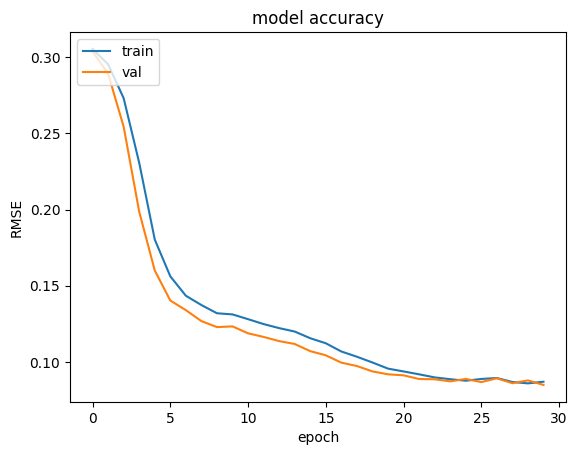

In [ ]:
from matplotlib import pyplot as plt

plt.plot(history.history['root_mean_squared_error'])
plt.plot(history.history['val_root_mean_squared_error'])
plt.title('model accuracy')
plt.ylabel('RMSE')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

<----------------------- Evaluate for pure CNN ------------------------>

In [ ]:
model.evaluate([testX[:,:,:,:4], testX[:,:,:,4:]], testY)


<----------------------- Evaluate for CNN with FFN ------------------------>

In [ ]:
model.evaluate([testX[:,:,:,:4], testX[:,:,:,4:]], testY.reshape([testY.shape[0], testY.shape[2] * testY.shape[1]]))

1/1 [==============================] - 1s 548ms/step - loss: 1.4778 - root_mean_squared_error: 0.0871


[1.4777945280075073, 0.08707978576421738]

In [ ]:
model.save("top_model.keras")


<----------------------- Visualising the results ------------------------>

1/1 [==============================] - 0s 299ms/step


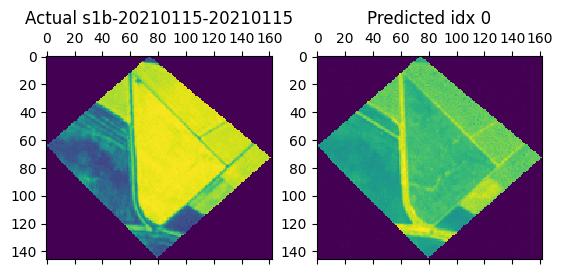

0.15187299
1/1 [==============================] - 0s 20ms/step


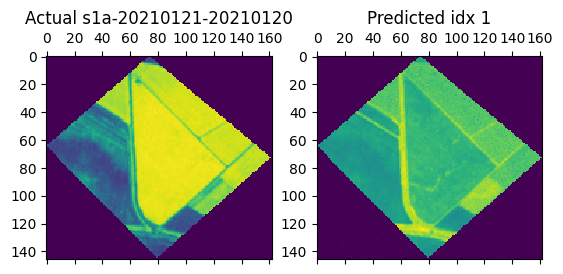

0.16501455
1/1 [==============================] - 0s 20ms/step


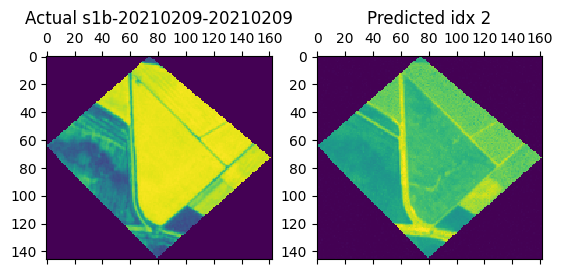

0.13762233
1/1 [==============================] - 0s 137ms/step


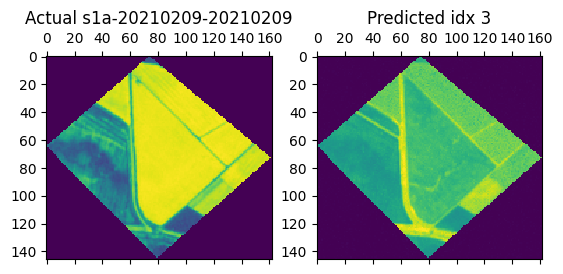

0.13762721
1/1 [==============================] - 0s 60ms/step


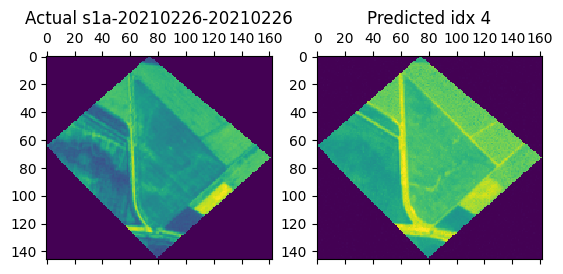

0.23112051
1/1 [==============================] - 0s 56ms/step


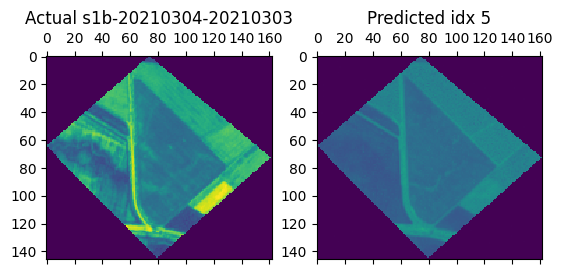

0.05680413
1/1 [==============================] - 0s 55ms/step


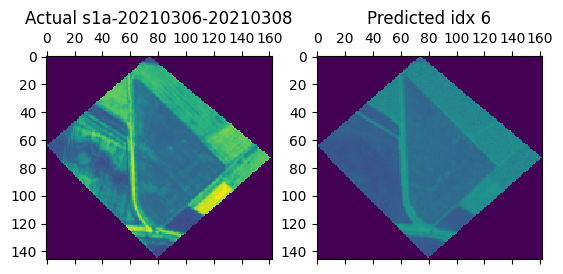

0.059117407
1/1 [==============================] - 0s 42ms/step


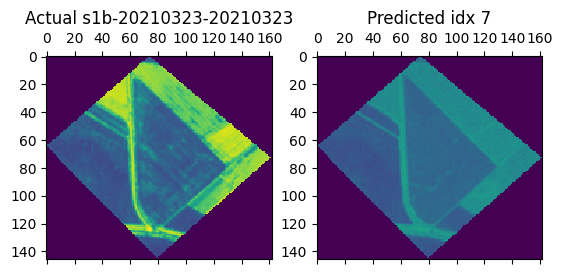

0.08016298
1/1 [==============================] - 0s 92ms/step


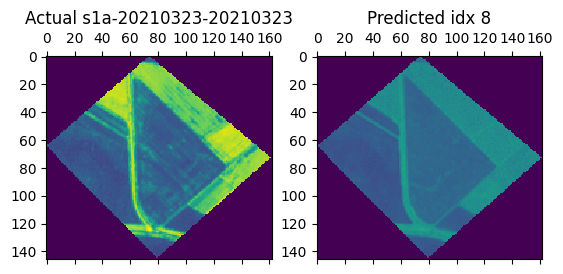

0.07983021
1/1 [==============================] - 0s 20ms/step


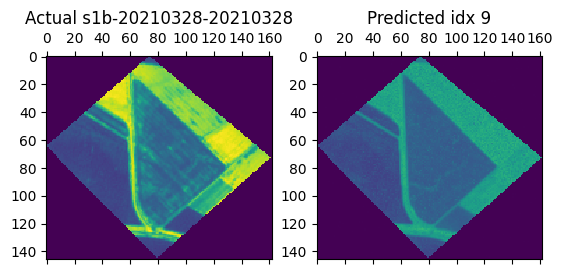

0.054913722
1/1 [==============================] - 0s 21ms/step


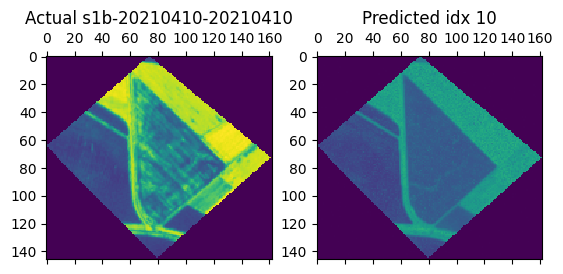

0.11046794
1/1 [==============================] - 0s 20ms/step


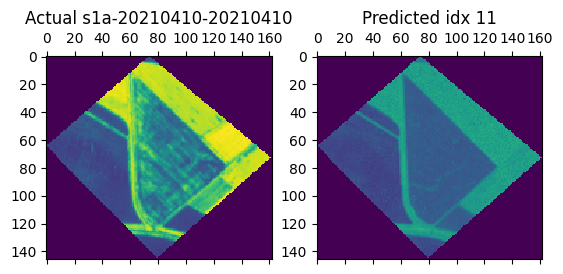

0.11055234
1/1 [==============================] - 0s 28ms/step


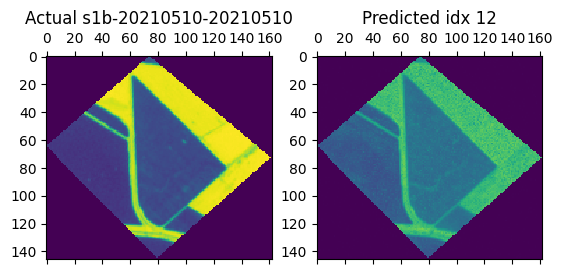

0.12166495
1/1 [==============================] - 0s 20ms/step


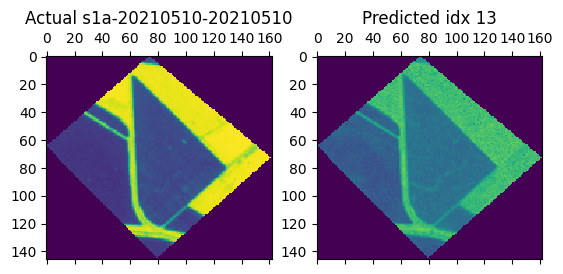

0.12129058
1/1 [==============================] - 0s 19ms/step


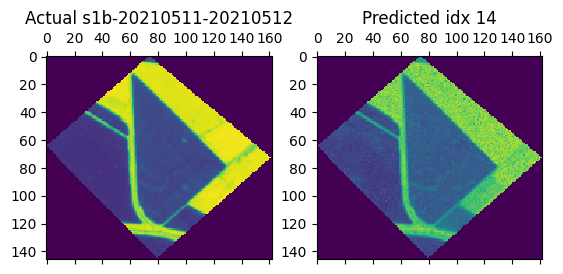

0.06679969
1/1 [==============================] - 0s 22ms/step


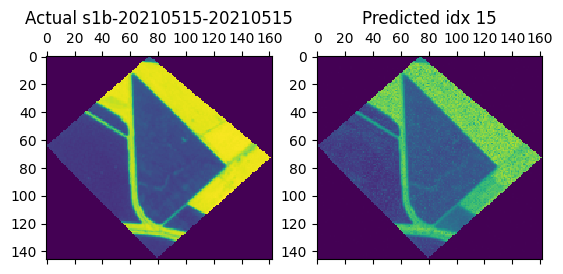

0.06566926
1/1 [==============================] - 0s 37ms/step


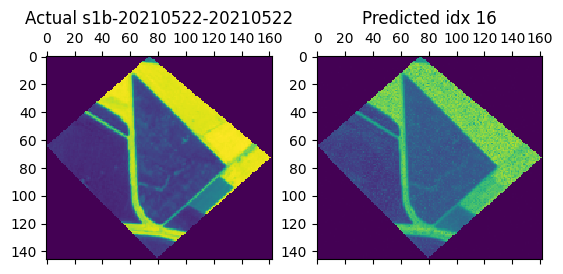

0.08307449
1/1 [==============================] - 0s 46ms/step


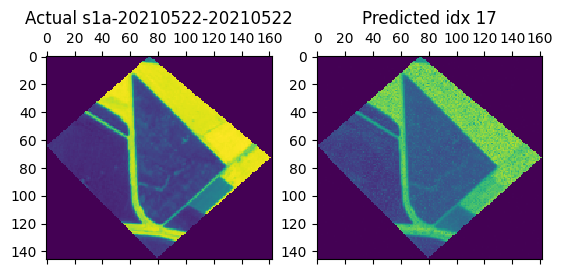

0.08276882
1/1 [==============================] - 0s 29ms/step


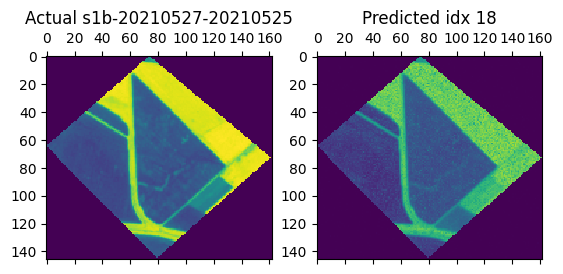

0.059450008
1/1 [==============================] - 0s 30ms/step


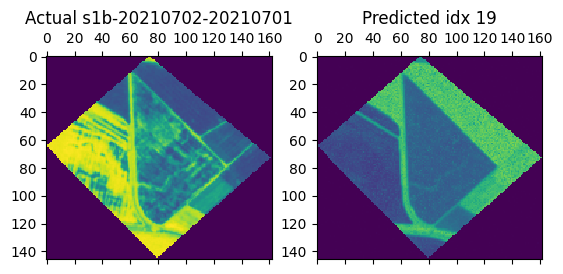

0.26335463
1/1 [==============================] - 0s 52ms/step


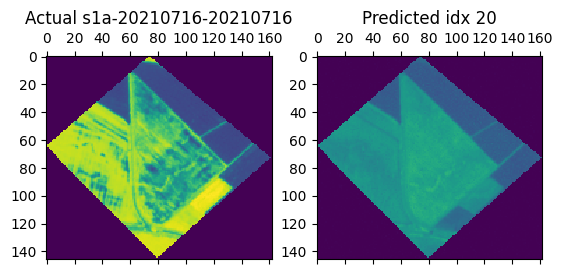

0.13313715
1/1 [==============================] - 0s 27ms/step


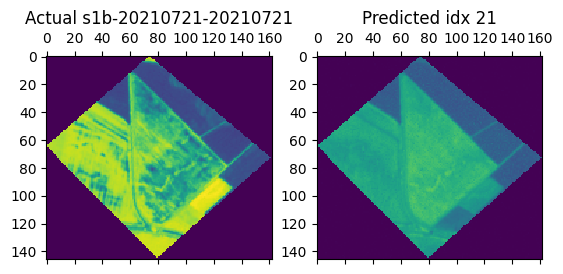

0.1043725
1/1 [==============================] - 0s 26ms/step


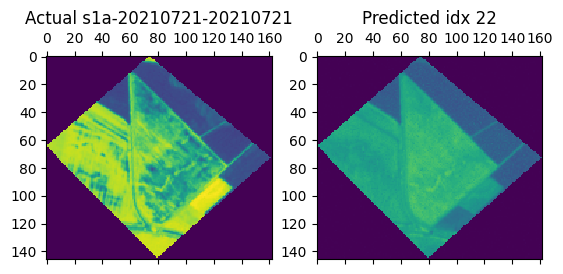

0.10445401
1/1 [==============================] - 0s 22ms/step


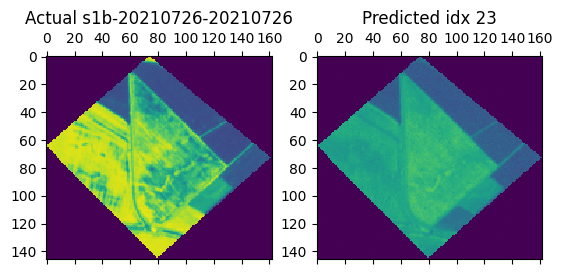

0.093997695
1/1 [==============================] - 0s 29ms/step


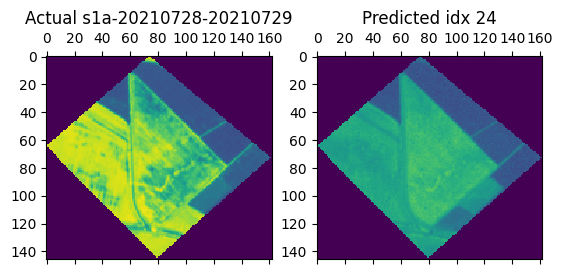

0.07950201
1/1 [==============================] - 0s 26ms/step


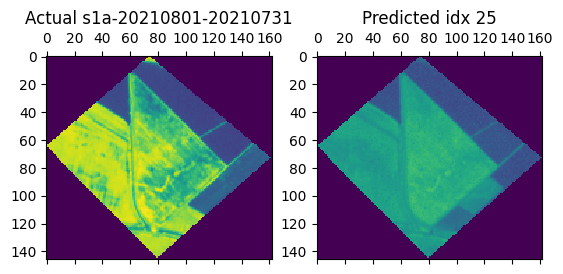

0.08402085
1/1 [==============================] - 0s 29ms/step


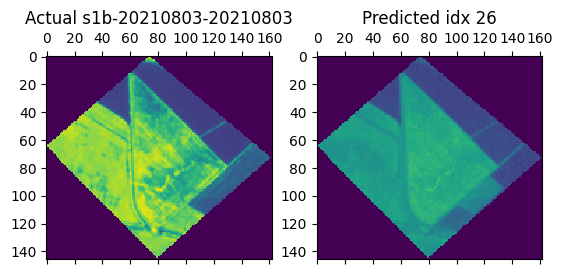

0.075230524
1/1 [==============================] - 0s 25ms/step


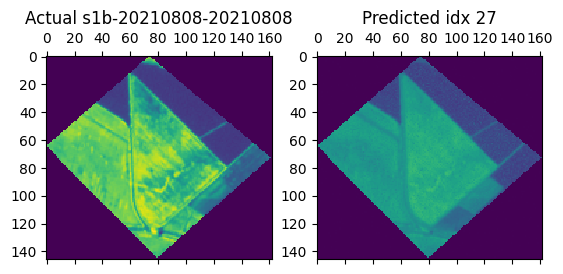

0.0732034
1/1 [==============================] - 0s 22ms/step


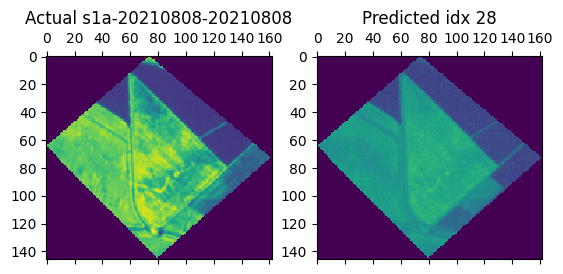

0.073165625
1/1 [==============================] - 0s 21ms/step


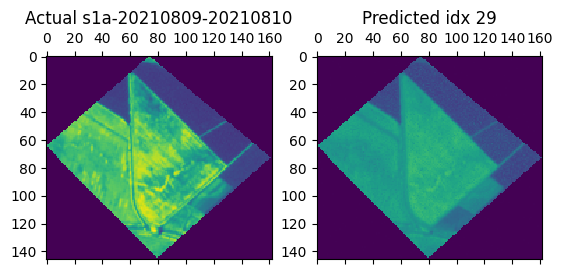

0.052916005
1/1 [==============================] - 0s 26ms/step


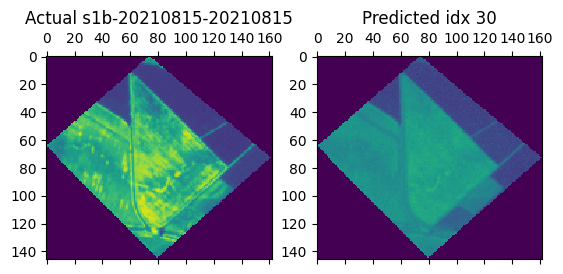

0.056675922
1/1 [==============================] - 0s 22ms/step


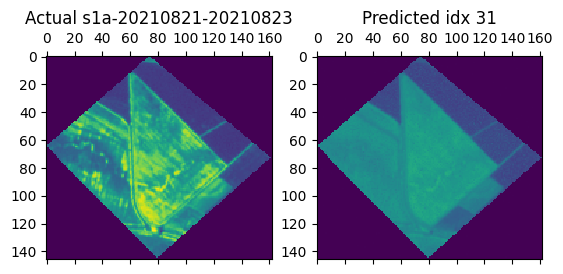

0.0682512
1/1 [==============================] - 0s 20ms/step


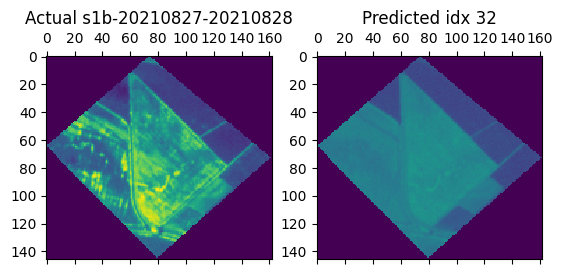

0.07001787
1/1 [==============================] - 0s 23ms/step


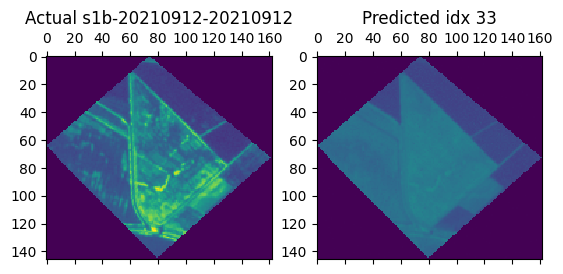

0.07231476
1/1 [==============================] - 0s 21ms/step


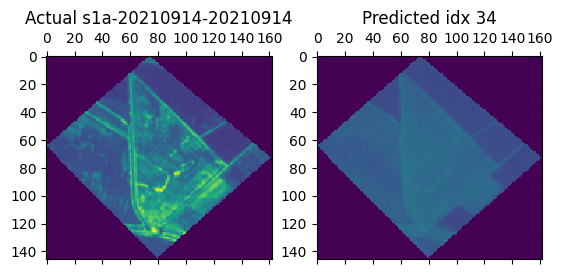

0.061802395
1/1 [==============================] - 0s 20ms/step


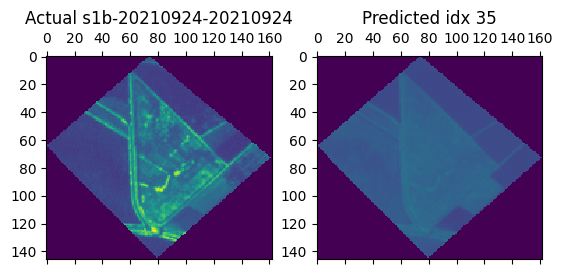

0.06540795
1/1 [==============================] - 0s 31ms/step


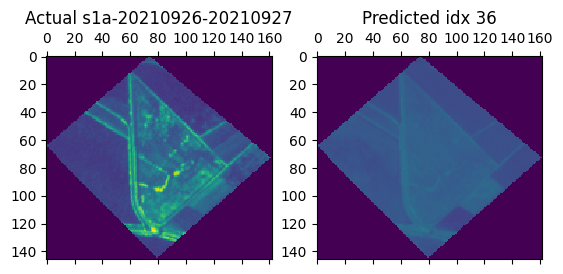

0.06338946
1/1 [==============================] - 0s 27ms/step


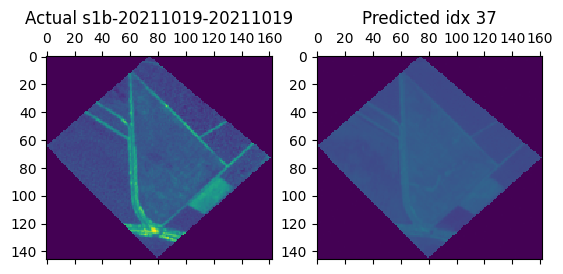

0.052103106
1/1 [==============================] - 0s 27ms/step


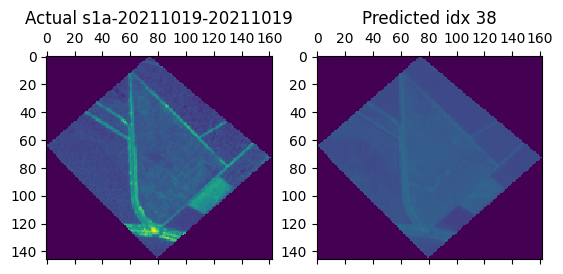

0.05195949
1/1 [==============================] - 0s 30ms/step


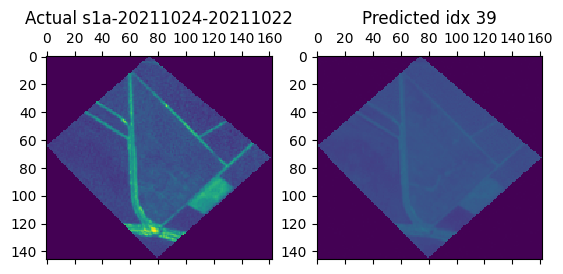

0.053315762
1/1 [==============================] - 0s 55ms/step


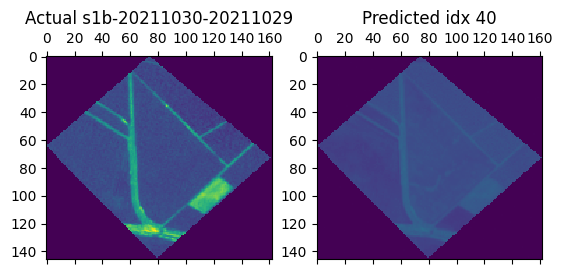

0.05787231
1/1 [==============================] - 0s 50ms/step


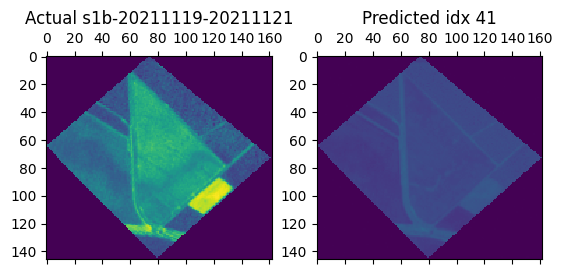

0.16504544
1/1 [==============================] - 0s 26ms/step


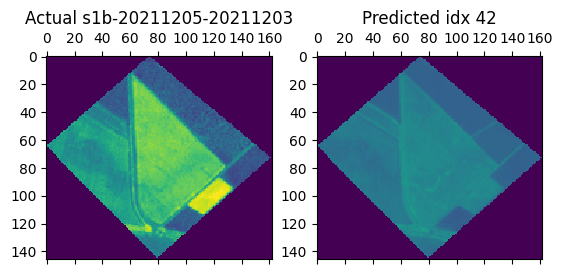

0.11832264
1/1 [==============================] - 0s 24ms/step


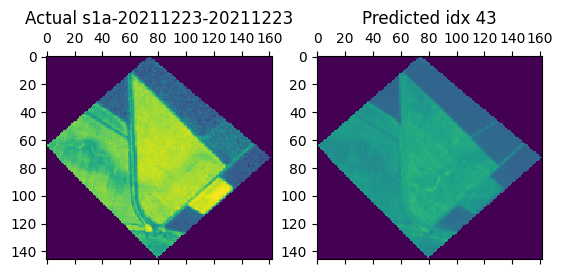

0.08949906
1/1 [==============================] - 0s 21ms/step


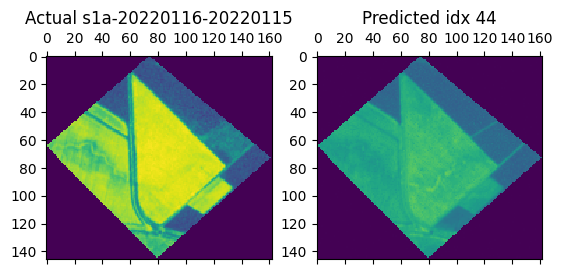

0.10593358
1/1 [==============================] - 0s 23ms/step


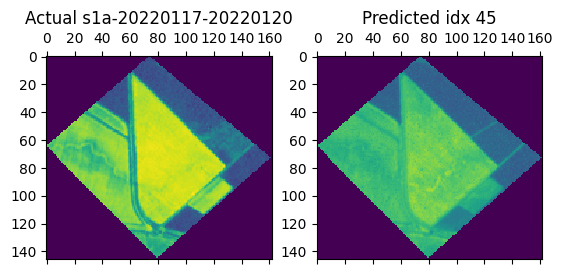

0.06639207
1/1 [==============================] - 0s 27ms/step


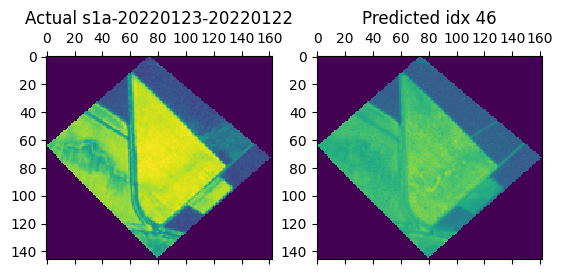

0.073751785
1/1 [==============================] - 0s 25ms/step


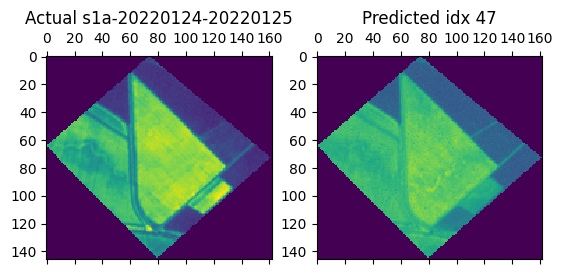

0.23369792
1/1 [==============================] - 0s 24ms/step


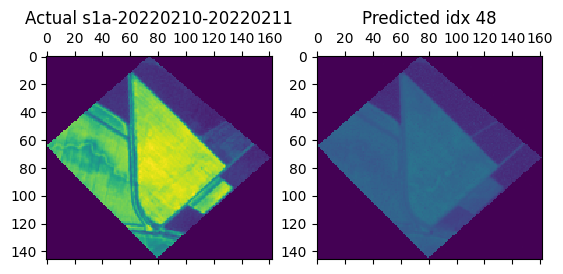

0.078840196
1/1 [==============================] - 0s 27ms/step


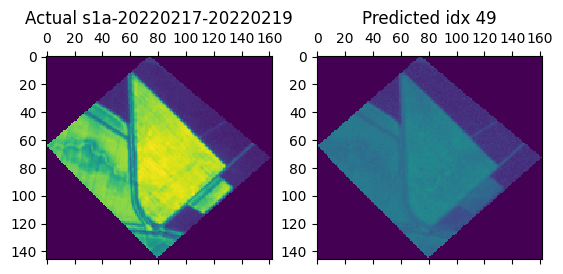

0.061373573
1/1 [==============================] - 0s 31ms/step


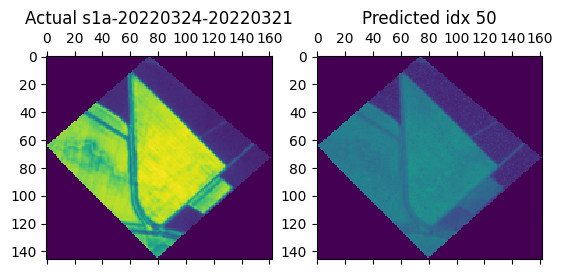

0.07130544
1/1 [==============================] - 0s 26ms/step


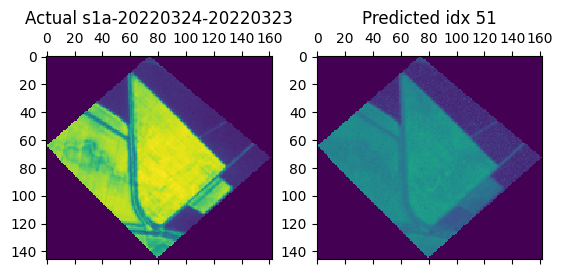

0.055688776
1/1 [==============================] - 0s 32ms/step


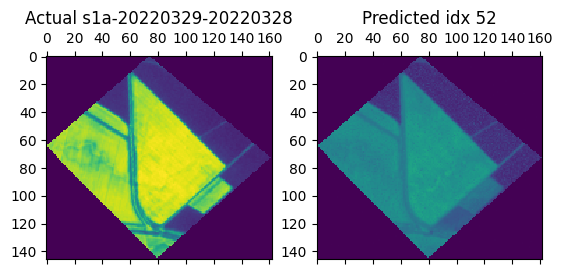

0.053652387
1/1 [==============================] - 0s 29ms/step


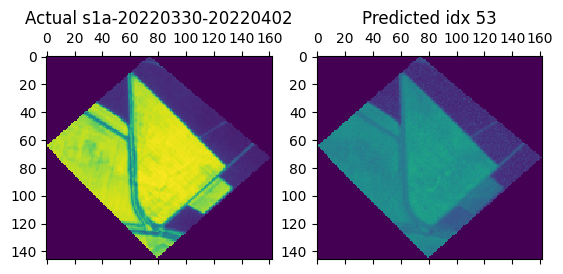

0.07480051
1/1 [==============================] - 0s 28ms/step


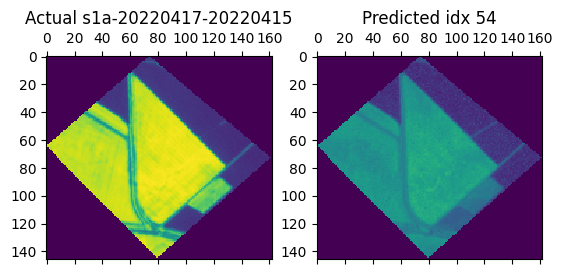

0.060108177
1/1 [==============================] - 0s 28ms/step


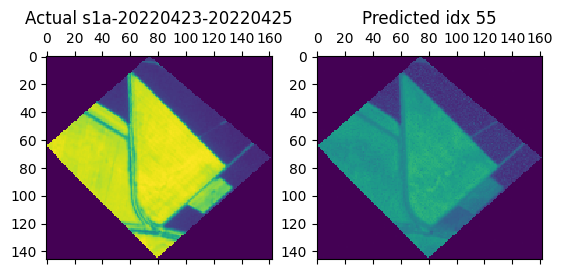

0.05768029
1/1 [==============================] - 0s 58ms/step


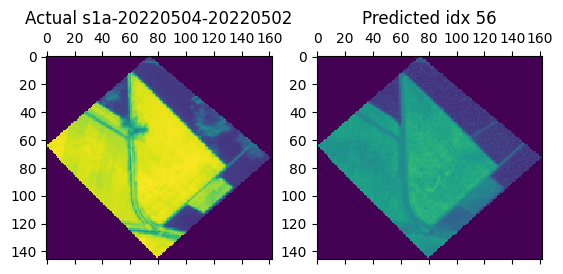

0.06667686
1/1 [==============================] - 0s 36ms/step


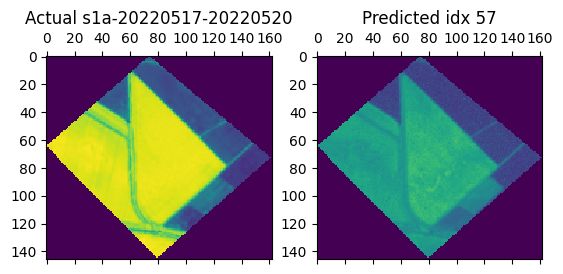

0.063918576
1/1 [==============================] - 0s 35ms/step


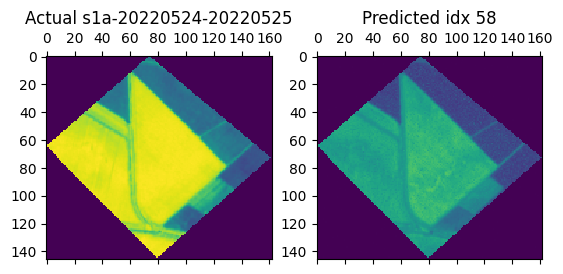

0.036599226
1/1 [==============================] - 0s 38ms/step


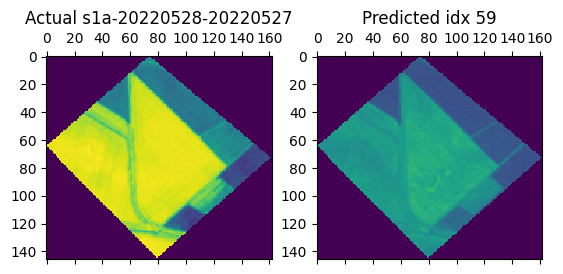

0.0676588
1/1 [==============================] - 0s 70ms/step


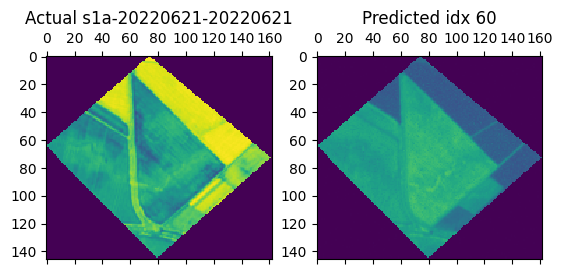

0.17790417
1/1 [==============================] - 0s 58ms/step


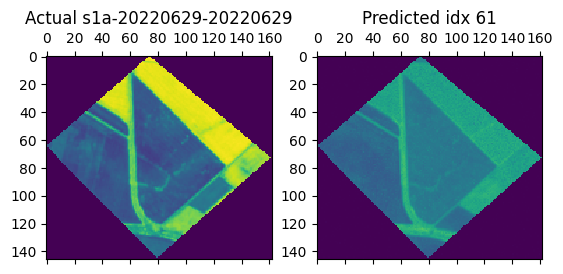

0.11768445
1/1 [==============================] - 0s 33ms/step


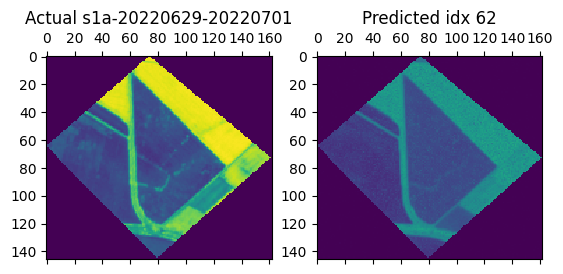

0.063944966
1/1 [==============================] - 0s 29ms/step


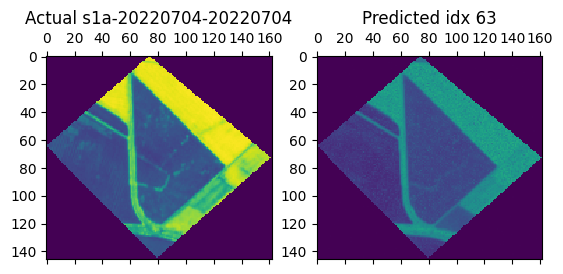

0.05439178
1/1 [==============================] - 0s 35ms/step


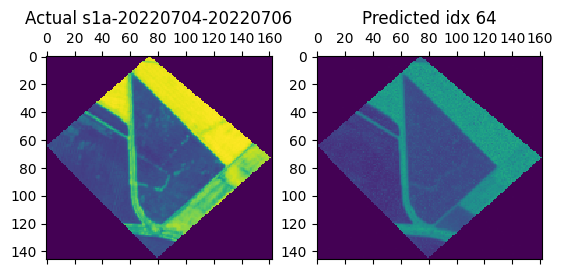

0.054162476
1/1 [==============================] - 0s 32ms/step


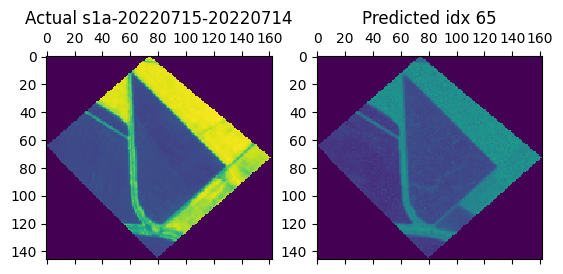

0.060958408
1/1 [==============================] - 0s 30ms/step


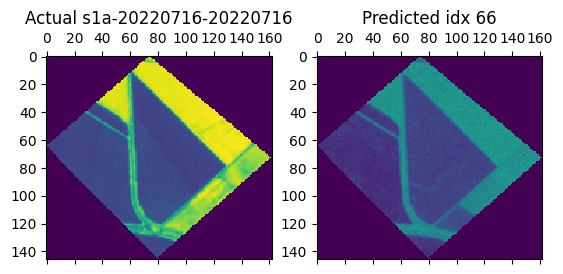

0.05302546
1/1 [==============================] - 0s 34ms/step


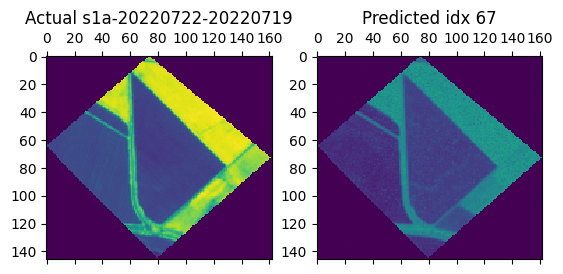

0.055666495
1/1 [==============================] - 0s 29ms/step


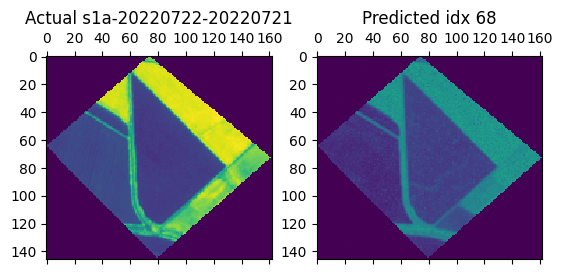

0.05313473
1/1 [==============================] - 0s 27ms/step


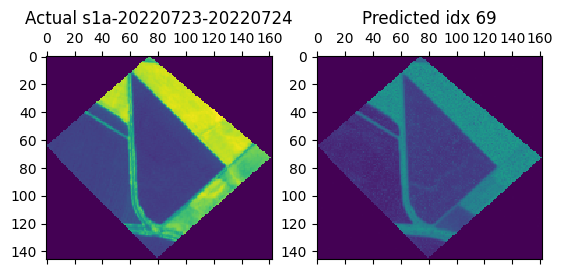

0.047536023
1/1 [==============================] - 0s 28ms/step


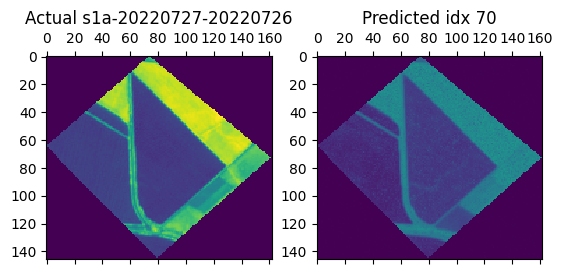

0.052327346
1/1 [==============================] - 0s 28ms/step


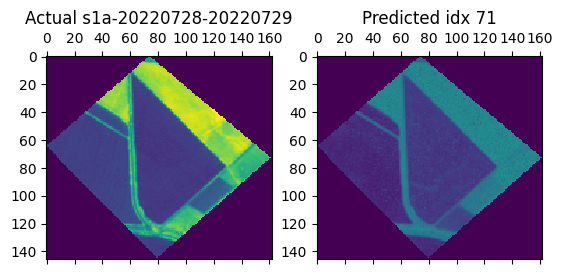

0.05354641
1/1 [==============================] - 0s 27ms/step


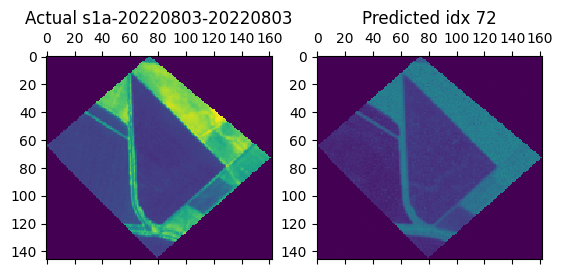

0.048382208
1/1 [==============================] - 0s 27ms/step


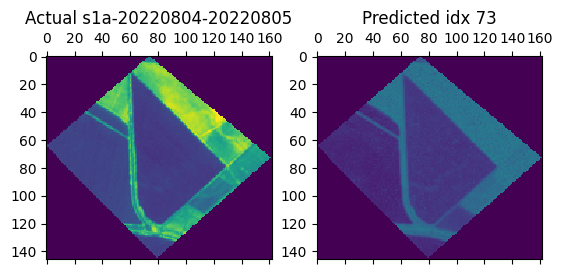

0.046487484
1/1 [==============================] - 0s 29ms/step


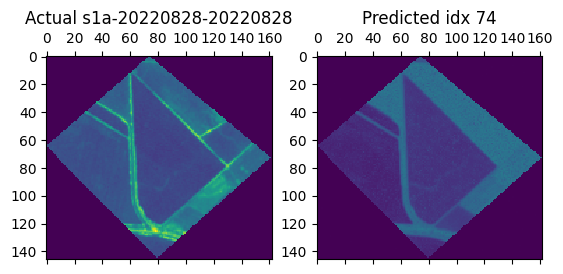

0.08166799
1/1 [==============================] - 0s 33ms/step


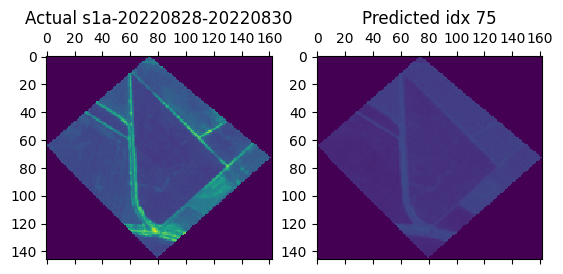

0.033286653
1/1 [==============================] - 0s 53ms/step


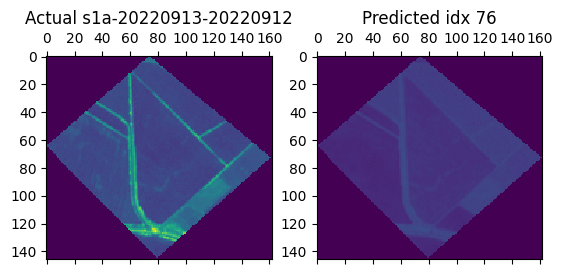

0.03604872
1/1 [==============================] - 0s 51ms/step


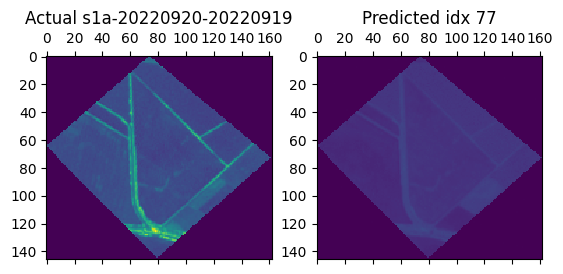

0.030226044
1/1 [==============================] - 0s 65ms/step


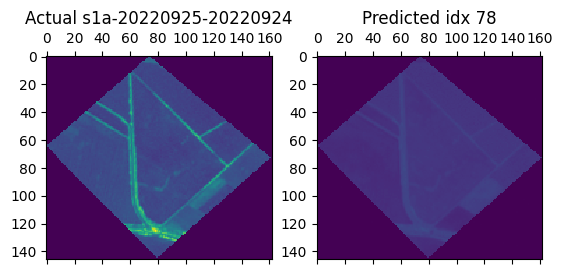

0.03164536
1/1 [==============================] - 0s 52ms/step


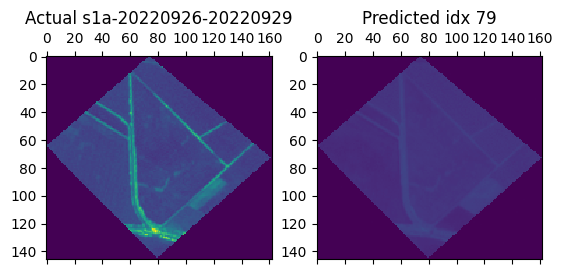

0.033088516
1/1 [==============================] - 0s 28ms/step


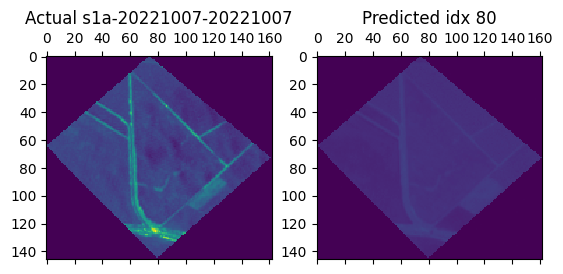

0.030449511
1/1 [==============================] - 0s 48ms/step


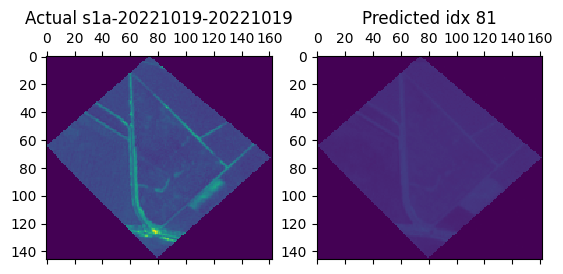

0.025163405
1/1 [==============================] - 0s 33ms/step


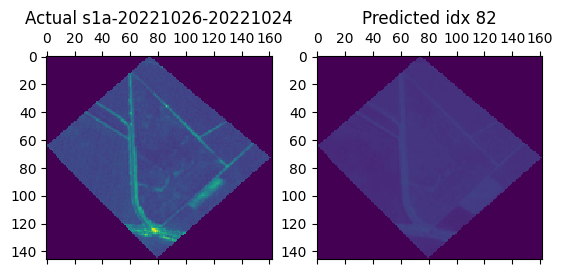

0.027606936
1/1 [==============================] - 0s 48ms/step


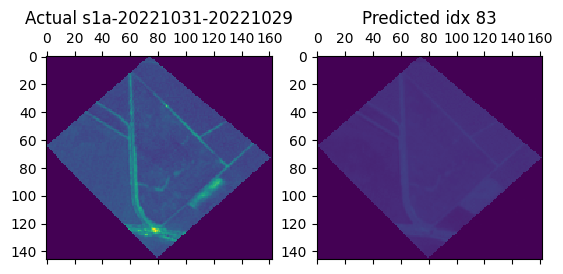

0.02220597
1/1 [==============================] - 0s 29ms/step


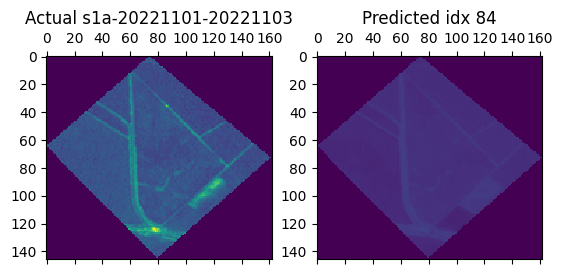

0.025927134
1/1 [==============================] - 0s 34ms/step


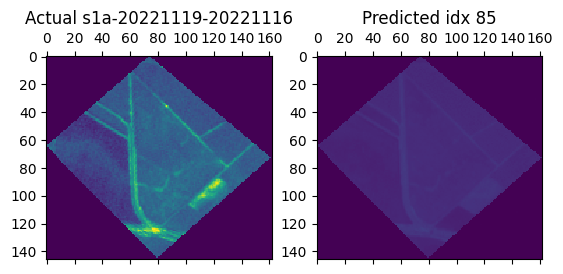

0.027059613
1/1 [==============================] - 0s 34ms/step


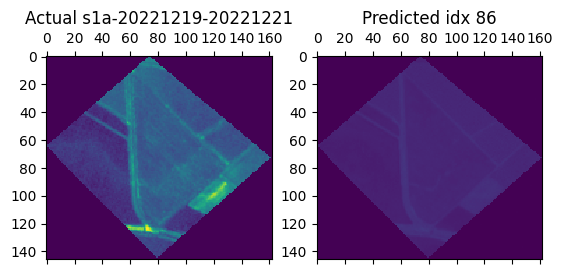

0.029295791
1/1 [==============================] - 0s 29ms/step


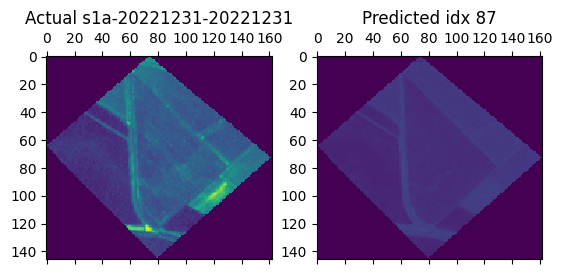

0.027044043
1/1 [==============================] - 0s 27ms/step


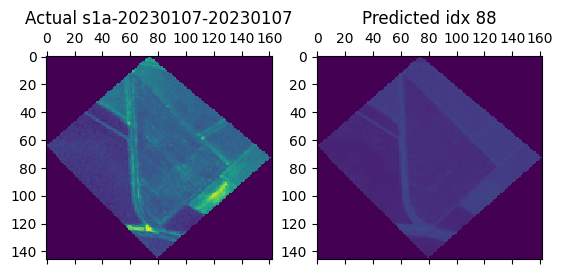

0.027537327
1/1 [==============================] - 0s 27ms/step


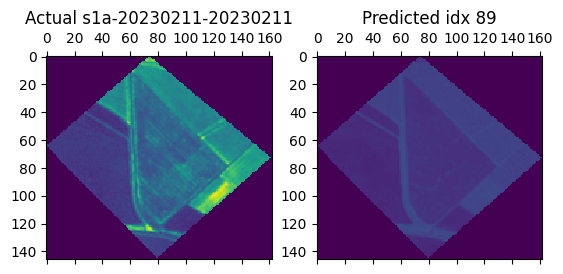

0.049739633
1/1 [==============================] - 0s 29ms/step


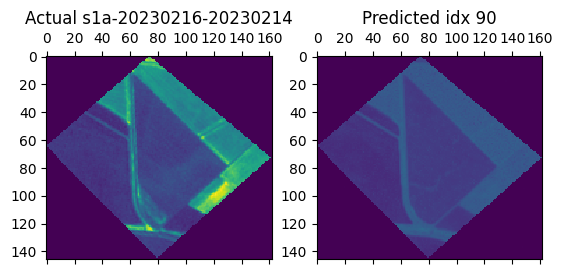

0.050840363
1/1 [==============================] - 0s 29ms/step


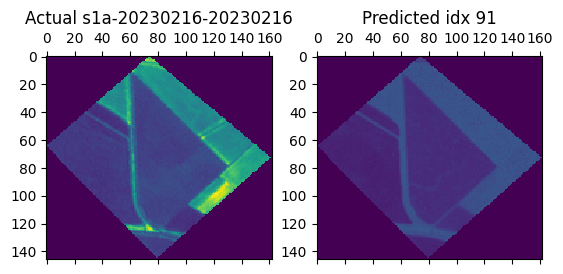

0.033405554
1/1 [==============================] - 0s 31ms/step


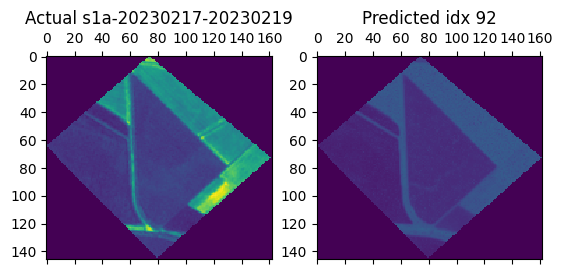

0.03637535
1/1 [==============================] - 0s 33ms/step


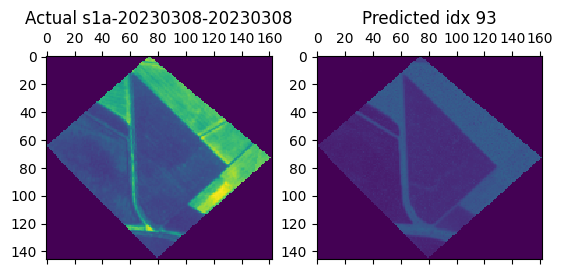

0.04841604
1/1 [==============================] - 0s 30ms/step


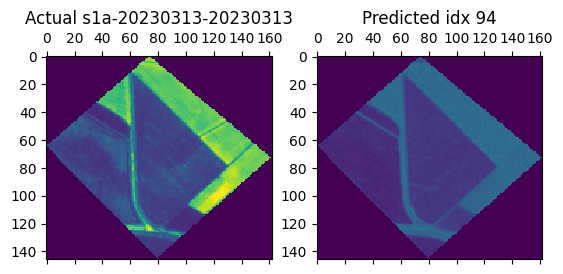

0.069736294
1/1 [==============================] - 0s 37ms/step


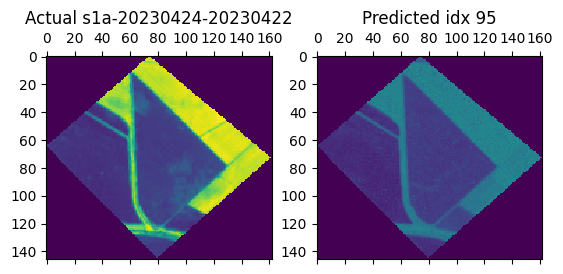

0.07457318
1/1 [==============================] - 0s 43ms/step


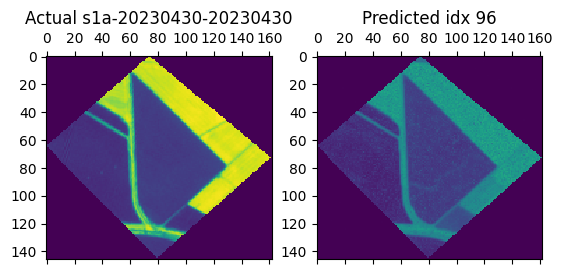

0.056573562
1/1 [==============================] - 0s 46ms/step


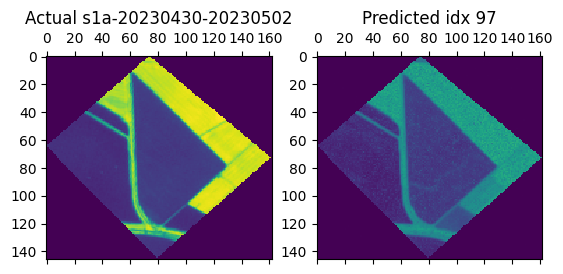

0.05482343
1/1 [==============================] - 0s 58ms/step


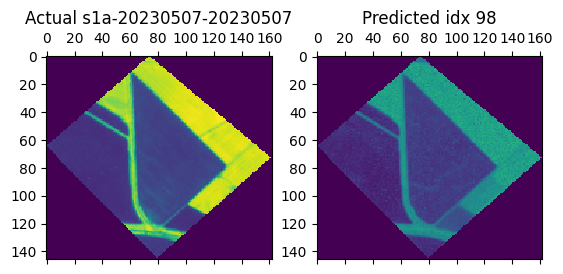

0.047864575
1/1 [==============================] - 0s 47ms/step


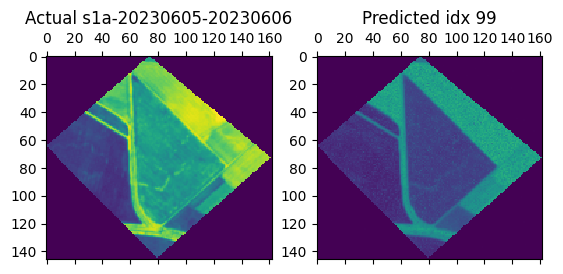

0.08586498
1/1 [==============================] - 0s 60ms/step


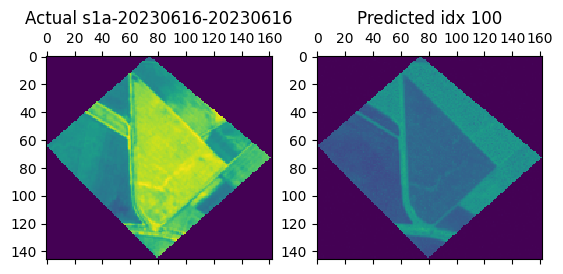

0.10316672
1/1 [==============================] - 0s 46ms/step


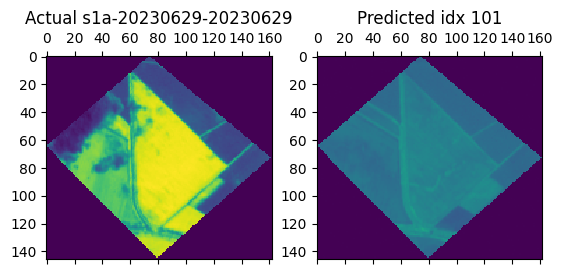

0.13562697
1/1 [==============================] - 0s 29ms/step


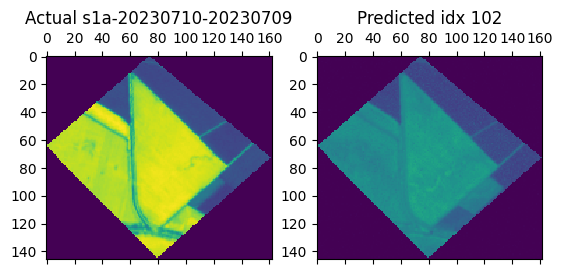

0.07090238
1/1 [==============================] - 0s 30ms/step


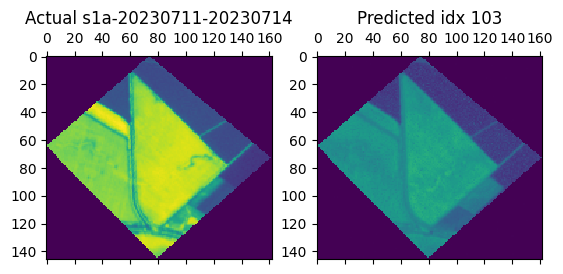

0.043068353
1/1 [==============================] - 0s 30ms/step


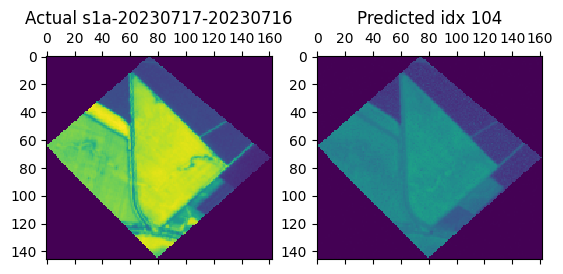

0.055406876
1/1 [==============================] - 0s 32ms/step


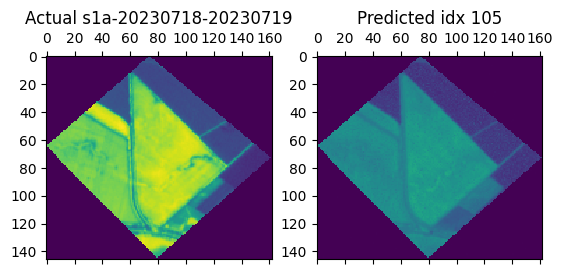

0.039123785
1/1 [==============================] - 0s 36ms/step


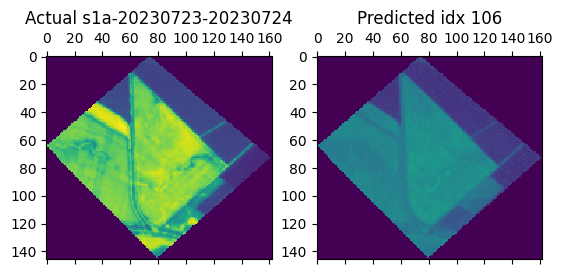

0.042701963
1/1 [==============================] - 0s 31ms/step


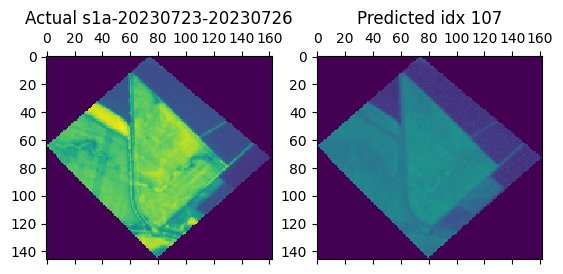

0.03702246
1/1 [==============================] - 0s 28ms/step


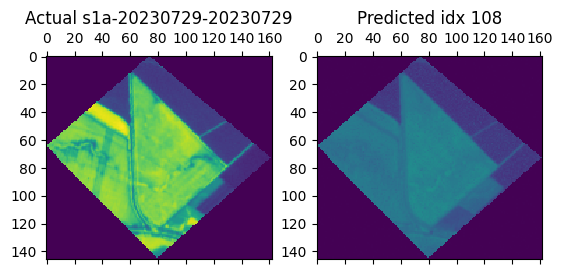

0.06497675
1/1 [==============================] - 0s 39ms/step


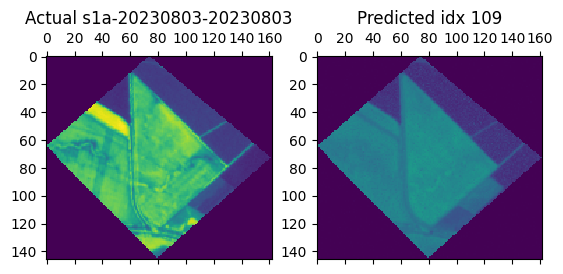

0.054746013
1/1 [==============================] - 0s 31ms/step


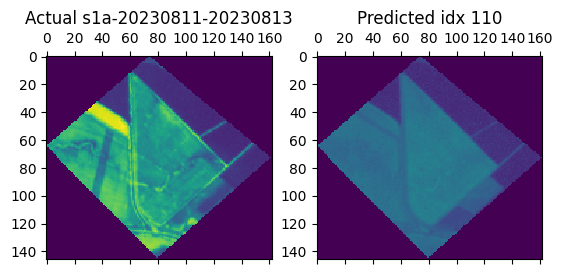

0.060055036


In [ ]:
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot as plt


for idx, entry in enumerate(dataset):
  sar = np.reshape(entry['sarImage'], (1, entry['sarImage'].shape[0], entry['sarImage'].shape[1], entry['sarImage'].shape[2]))[:,:,:,:4]
  lastNDVI = np.reshape(entry['sarImage'], (1, entry['sarImage'].shape[0], entry['sarImage'].shape[1], entry['sarImage'].shape[2]))[:,:,:,4:]

  prediction = model.predict([sar, lastNDVI])
  prediction = np.reshape(prediction, entry['y'].shape)
  actual = entry['y']

  fig = plt.figure()
  ax = fig.add_subplot(121)
  ax.matshow(actual)
  ax.set_title("Actual " + entry['id'])
  ax2 = fig.add_subplot(122)
  ax2.matshow(prediction, vmin=0, vmax=1)
  ax2.set_title("Predicted idx " + str(idx))
  plt.show()

  mse = mean_squared_error(actual, prediction)
  print(np.sqrt(mse))

